# Figures for Case-control comparison

We assessed regional mean differences in deviations from the normative model between each diagnosis group and the held-out TD cohort using Permutation Analysis of Linear Models (PALM)

The subsequent code does the following: 
1. Radar plots showing the number of significant regions for each group. 
2. Plots sub-cortical plots showing regions with statistically significant difference in deviations for each patient group. NOTE: Cortical figures were generated using MATLAB script (palm_case_control_surfaceplot.m)
3. Combines all group cortical and sub-cortical plots into a single figure

In [3]:
#Imports
import os
import sys
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
function_path = '/scratch/kg98/Ashlea/lesion_networks/code/functions'
sys.path.append(function_path)
from helpful_functions import unique
from statannot import add_stat_annotation
import matplotlib as mpl

In [4]:
#Directories
deviation_dir = '/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/'
#Import files  
patientGroups = ['ASD', 'SCZ', 'BIPOL', 'MDD', 'OCD', 'ADHD'];

### 1. Radar Plots

['ASD', 'SCZ', 'BIPOL', 'MDD', 'OCD', 'ADHD']
/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/Radarplot_palm_dat_tstat_uncp_pthr25.png


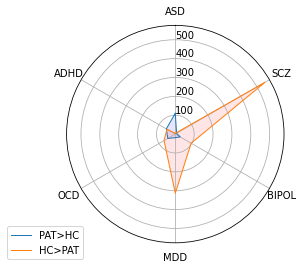

/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/Radarplot_palm_dat_tstat_cfdrp_pthr25.png


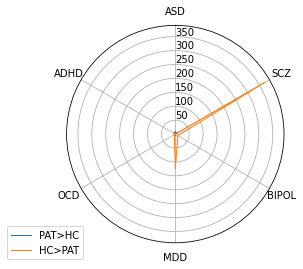

/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/Radarplot_palm_dat_tstat_cfwep_pthr25.png


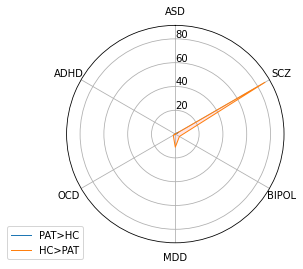

In [5]:
# Radar Plot  
print(patientGroups)

from math import pi

thr = 0.025   
correction_methods = ['unc','cfdr','cfwe']
pval_string = '25';
grp_directions = ['c1','c2']

maindir = '/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/'

for correction_method in correction_methods:
    sig_direc = np.zeros((len(patientGroups),1032))

    num_sig_rois = dict()
    num_sig_rois['c1']= np.zeros((len(patientGroups)))
    num_sig_rois['c2']= np.zeros((len(patientGroups)))
    
    file_string = 'palm_dat_tstat_' + correction_method + 'p' 

    for grp_direction in grp_directions: 

        for i in range(0,len(patientGroups)):

            diagnosis = patientGroups[i]

            filename = maindir + diagnosis + '/' + file_string + '_' + grp_direction  + '.csv'
            pvalues = np.loadtxt(filename, delimiter= ',')
            num_sig_rois[grp_direction][i] = np.sum(pvalues<thr)
            
    # ----------------------------------------------------------------------------
    # diagnosis summary radar
    # ----------------------------------------------------------------------------

    # ------- PART 1: Create background

    # number of variable
    categories=patientGroups
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(111, polar=True)

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories)

    # Draw ylabels
    ax.set_rlabel_position(0)
    #plt.yticks([1,2,3,4,5,6,7,8], ["1","2","3","4", "5", "6","7","8"], color="grey", size=7)
    #plt.ylim(0,9)

    # ------- PART 2: Add plots

    # Plot each individual = each line of the data

    # Ind1
    #values=grp_summary[:,0].tolist()
    values=num_sig_rois['c1'].tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=1, linestyle='solid', label="PAT>HC")
    ax.fill(angles, values, 'b', alpha=0.1)

    # Ind2
    #values=grp_summary[:,2].tolist()
    values=num_sig_rois['c2'].tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=1, linestyle='solid', label="HC>PAT")
    ax.fill(angles, values, 'r', alpha=0.1)

    # Add legend
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

    plt_filename =  maindir + 'Radarplot_'+file_string+'_pthr'+pval_string+'.png'
    print(plt_filename)
    plt.savefig(plt_filename,dpi=1200)
    plt.show()
    plt.close()

# 1. Sub-cortical figures

(4, 4)
(5, 4)
ASD
cfdr
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]


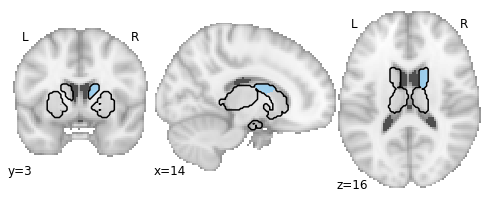

cfwe
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]


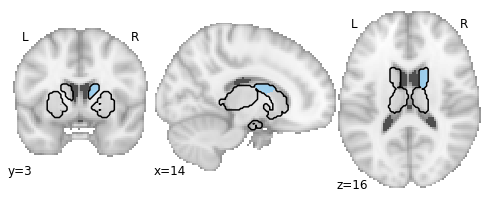

SCZ
cfdr
[1. 1. 1. 1. 1. 0. 1. 0. 0. 0. 4. 4. 4. 4. 0. 0. 1. 1. 1. 1. 0. 0. 1. 0.
 0. 0. 4. 4. 4. 4. 0. 0.]


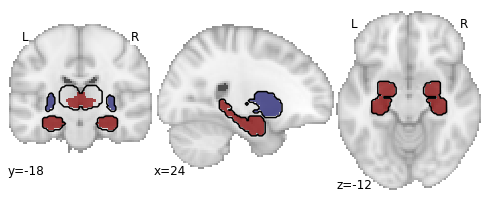

cfwe
[1. 1. 1. 1. 2. 0. 2. 0. 0. 0. 4. 4. 3. 3. 0. 0. 1. 1. 1. 1. 0. 0. 2. 0.
 0. 0. 3. 4. 3. 3. 0. 0.]


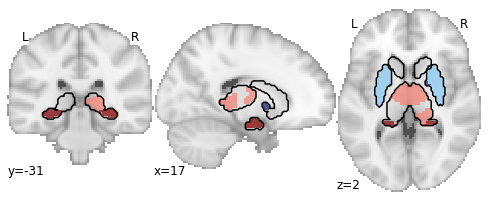

BIPOL
cfdr
[0. 2. 2. 1. 0. 0. 0. 0. 0. 0. 4. 3. 0. 0. 0. 0. 0. 2. 1. 1. 0. 0. 0. 0.
 0. 0. 0. 3. 0. 0. 0. 0.]


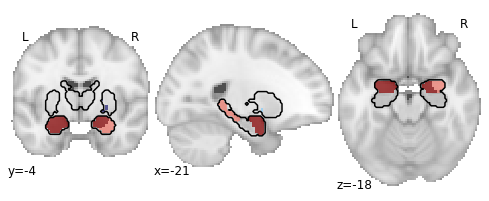

cfwe
[0. 2. 2. 1. 0. 0. 0. 0. 0. 0. 3. 3. 0. 0. 0. 0. 0. 2. 2. 1. 0. 0. 0. 0.
 0. 0. 0. 3. 0. 0. 0. 0.]


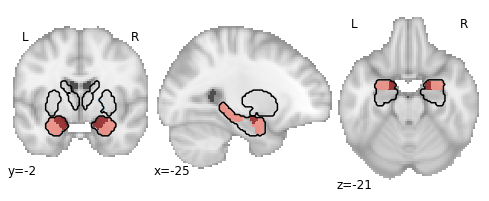

MDD
cfdr
[0. 0. 0. 0. 0. 2. 2. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 4. 0. 2. 0. 0. 2.
 0. 0. 0. 0. 0. 0. 0. 0.]


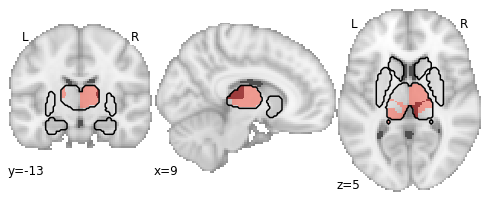

cfwe
[0. 0. 0. 0. 0. 2. 2. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 3. 0. 2. 0. 0. 2.
 0. 0. 0. 0. 0. 0. 0. 0.]


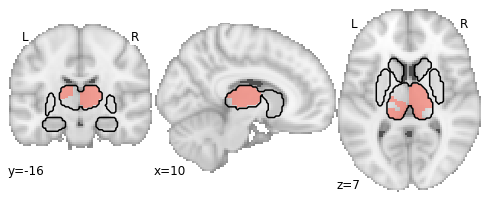

OCD
cfdr
[0. 1. 0. 0. 0. 0. 0. 0. 3. 3. 0. 3. 3. 4. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 3. 4. 0. 0.]


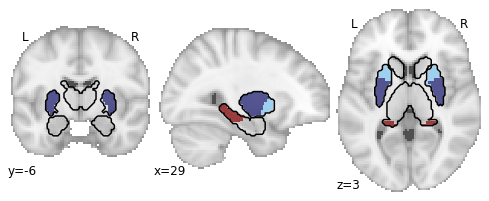

cfwe
[0. 1. 0. 0. 0. 0. 0. 0. 3. 3. 0. 3. 3. 4. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 3. 3. 0. 0.]


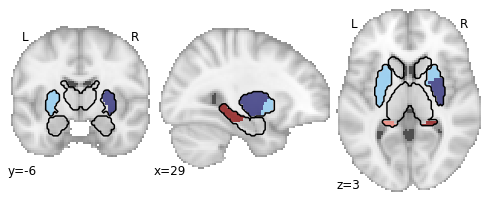

ADHD
cfdr
[0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 3. 0. 0. 0. 0.]


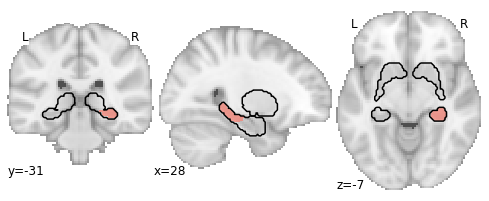

cfwe
[0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 3. 0. 0. 0. 0.]


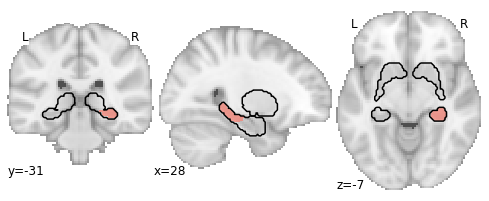

In [77]:
# Raw Subcortical plots
import nibabel as nib
import numpy as np
from nilearn import plotting
import matplotlib as mpl

# Colourmap 
colourmap_dir = '/scratch/kg98/Ashlea/deviation_network_mapping/code/cmaps';
colourmap_filename = colourmap_dir + '/colourmap_RdBu_binary.txt';
cmap = np.loadtxt(colourmap_filename)
print(np.shape(cmap))
cmap = np.insert(cmap, 2, np.array((0.7, 0.7, 0.7,1)), 0) 
print(np.shape(cmap))

cmap = mpl.colors.ListedColormap(cmap)
cmap.set_under(color=(0.7, 0.7, 0.7))

# Parcellation file
parcellation_filename = '/scratch/kg98/Ashlea/parcellation_v2/masks/Schaefer2018_1000Parcels_7Networks_Tian_Subcortex_S2_3T_T1space_combine_masked.nii.gz'
nifti_parcel = nib.load(parcellation_filename)
parcel_data = nifti_parcel.get_fdata()
parcel_data[parcel_data<1001] = 0 # exclude cortical

# Relevant inputs 
wdir = '/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/';
patientGroups = ['ASD', 'SCZ', 'BIPOL', 'MDD', 'OCD', 'ADHD'];
correction_methods = ['cfdr','cfwe'];
pval_string = '25';
pthr = 0.025;
Nrois = 1032;

for group in patientGroups:
    print(group)

    for correction_method in correction_methods:
        print(correction_method)

        # Loads raw values
        file_string = wdir+group+'/palm_dat_tstat_'+ correction_method+ 'p_c1.csv'
        data_cor_c1 = np.loadtxt(file_string,delimiter=',')

        file_string = wdir+group+'/palm_dat_tstat_uncp_c1.csv'
        data_unc_c1 = np.loadtxt(file_string,delimiter=',')
        
        file_string = wdir+group+'/palm_dat_tstat_'+ correction_method+ 'p_c2.csv'
        data_cor_c2 = np.loadtxt(file_string,delimiter=',')

        file_string = wdir+group+'/palm_dat_tstat_uncp_c2.csv'
        data_unc_c2 = np.loadtxt(file_string,delimiter=',')

        data = np.zeros((Nrois))
        data[data_unc_c1<pthr] = 3
        data[data_cor_c1<pthr] = 4
        data[data_unc_c2<pthr] = 2
        data[data_cor_c2<pthr] = 1
        
        data = data[1000:] # exclude subcortical
        print(data)
        # Put data into cifti space
        parcel_data_copy = np.copy(parcel_data)
        for i in range(0,32):
            roi_idx=1000+i+1
            parcel_data_copy[parcel_data_copy==roi_idx] = data[i]

        subcort_out = nib.Nifti1Image(parcel_data_copy,nifti_parcel.affine, nifti_parcel.header)
        subcort_out_filename = wdir+group+'/palm_dat_tstat_'+ correction_method+ 'p_pthr'+pval_string+'_subcortical.nii'    

        subcort_out_contour = nib.Nifti1Image(parcel_data,nifti_parcel.affine, nifti_parcel.header)
        display=plotting.plot_roi(subcort_out, display_mode='ortho', cmap=cmap, draw_cross=False, colorbar=False,vmax=4,vmin=1)
        display.add_contours(subcort_out_contour, levels=[0.5], colors='k')
        subcort_out_filename = wdir+group+'/palm_dat_tstat_'+ correction_method+ 'p_pthr'+pval_string+'_subcortical.png'    
        display.savefig(subcort_out_filename)#,dpi=1200) 
        #display.savefig(plt_filename, bbox_inches='tight',pad_inches=0.01)# ,dpi=1000)

        plotting.show()


0


# 2.  Combine sub-cortical and cortical plots

/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/palm_dat_tstat_cfdrp_pthr25_cor_subcort_combined.png
/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/palm_dat_tstat_cfwep_pthr25_cor_subcort_combined.png


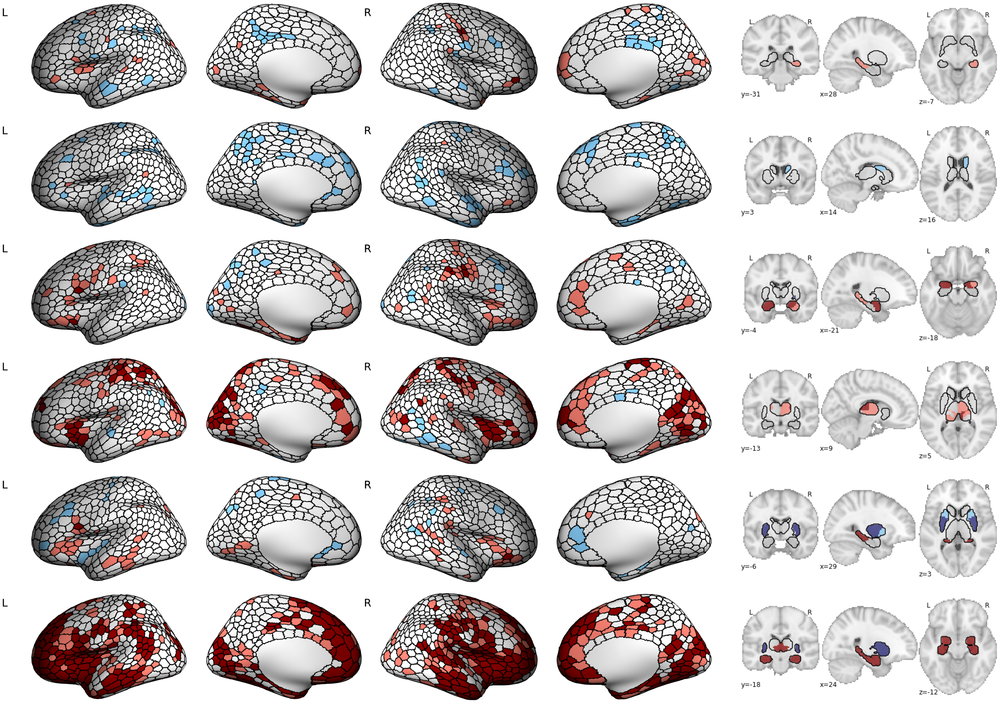

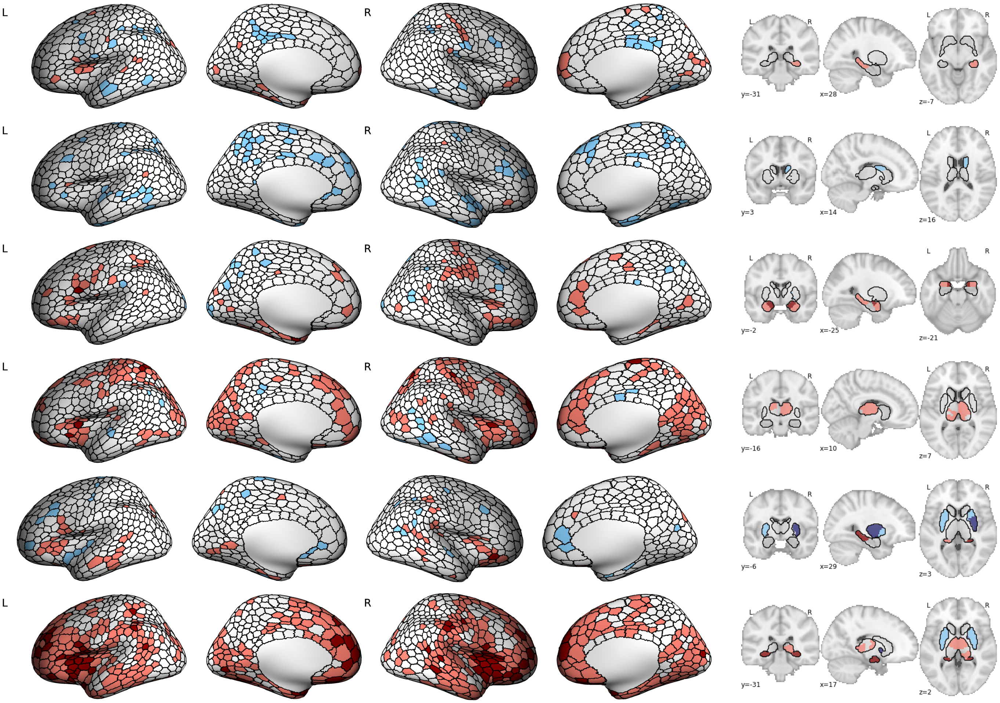

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os.path

#Adjustable things
correction_methods = ['cfdr','cfwe'];
patientGroups = ['ADHD','ASD','BIPOL','MDD','OCD','SCZ']
pval_string = '25'

# Cortical
for correction_method in correction_methods:

    #fig,ax = plt.subplots(len(patientGroups),2,gridspec_kw={'width_ratios':[3,1]})
    fig,ax = plt.subplots(len(patientGroups),2,gridspec_kw={'width_ratios':[3,1]}, figsize=(50,35))

    for i,group in enumerate(patientGroups): 

        main_dir = '/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/';

        indir = main_dir +group+'/';

        instring_cortical = 'palm_dat_tstat_'+ correction_method+ 'p_pthr'+pval_string   
        img = plt.imread(indir+instring_cortical+".png")
        ax[i,0].imshow(img)
        ax[i,0].axis('off')                

        instring_subcortical = 'palm_dat_tstat_'+ correction_method+ 'p_pthr'+pval_string+'_subcortical'    
        img = plt.imread(indir+instring_subcortical+".png")
        ax[i,1].imshow(img)
        ax[i,1].axis('off') 
        
    instring = 'palm_dat_tstat_'+ correction_method+ 'p_pthr'+pval_string + '_cor_subcort'

    plt.subplots_adjust(wspace=0, hspace=0.1)
    plt_filename =  main_dir + instring+'_combined.png'
    print(plt_filename)
    plt.savefig(plt_filename, bbox_inches='tight',pad_inches=0.01)# ,dpi=1000)
    #plt.show()

#fig = plt.gcf()
#fig.set_size_inches((8.5, 11), forward=False)
#fig.savefig(plt_filename, dpi=500)

c1
/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/palm_dat_tstat_cfdrp_c1_pthr5_subcortical_combined.png
c2
/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/palm_dat_tstat_cfdrp_c2_pthr5_subcortical_combined.png
c1
/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/palm_dat_tstat_cfwep_c1_pthr5_subcortical_combined.png
c2
/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/palm_dat_tstat_cfwep_c2_pthr5_subcortical_combined.png


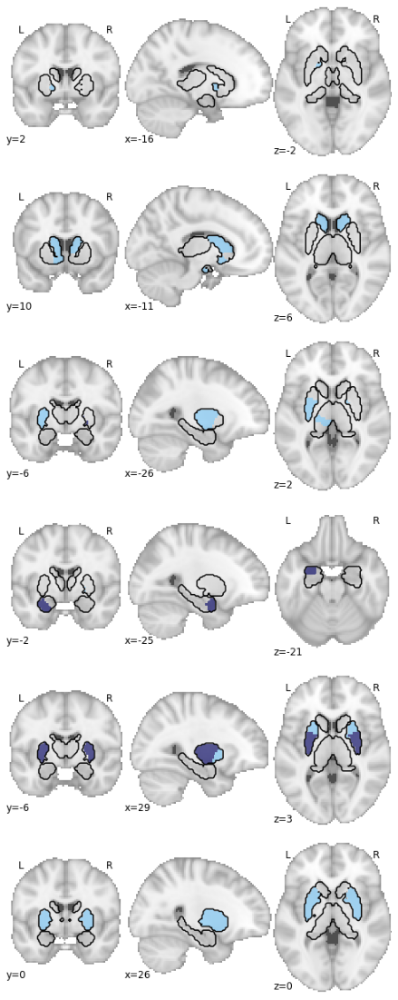

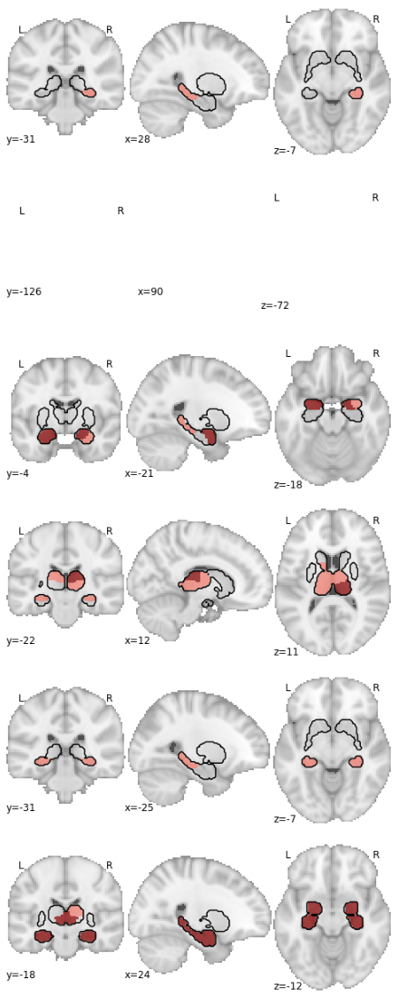

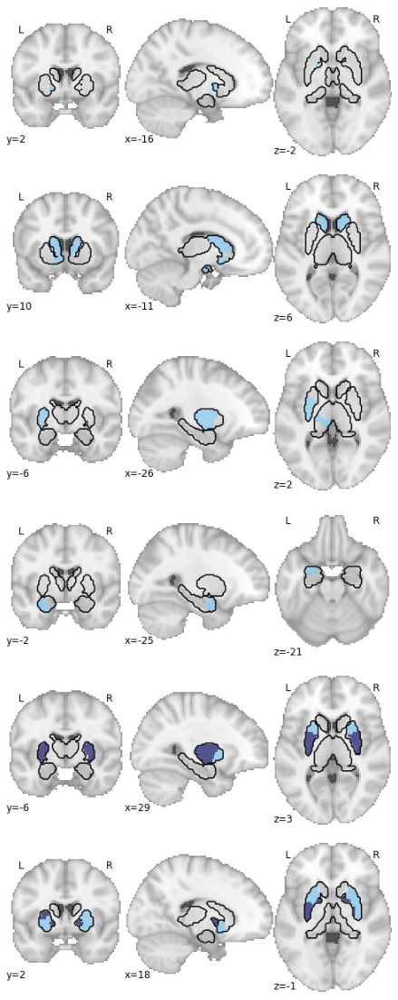

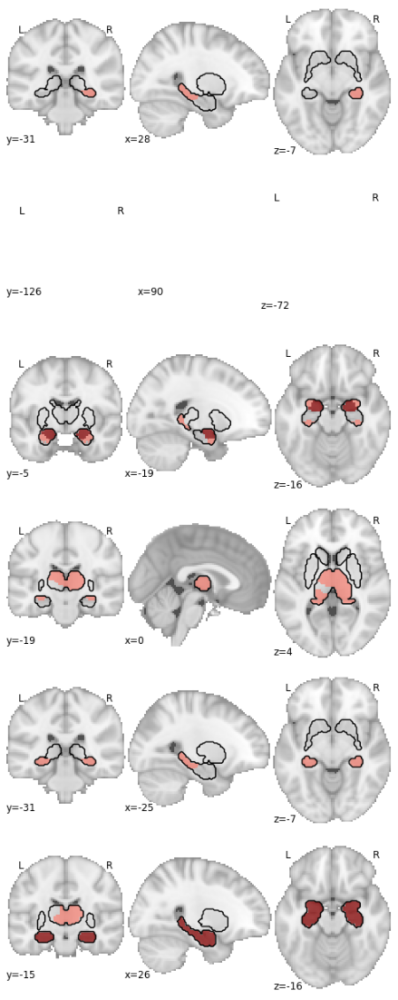

In [45]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os.path

#Adjustable things
directions = ['c1','c2']
correction_methods = ['cfdr','cfwe'];
patientGroups = ['ADHD','ASD','BIPOL','MDD','OCD','SCZ']

# Cortical
for correction_method in correction_methods:

    for direction in directions:  
            print(direction)
            fig,ax = plt.subplots(len(patientGroups),1,figsize=(50,20))
            for i,group in enumerate(patientGroups): 

                main_dir = '/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/';

                indir = main_dir +group+'/';
                instring = 'palm_dat_tstat_'+ correction_method+ 'p_'+ direction+'_pthr5_subcortical'    

                #img = cv2.imread(outdir+outstring+".png")
                img = plt.imread(indir+instring+".png")

                ax[i].imshow(img)
                ax[i].axis('off')
            plt.subplots_adjust(wspace=0, hspace=0.1)
            plt_filename =  main_dir + instring+'_combined.png'
            print(plt_filename)
            plt.savefig(plt_filename, bbox_inches='tight')# ,dpi=1000)
            #plt.show()

    #fig = plt.gcf()
    #fig.set_size_inches((8.5, 11), forward=False)
    #fig.savefig(plt_filename, dpi=500)

 ## Combine cortical

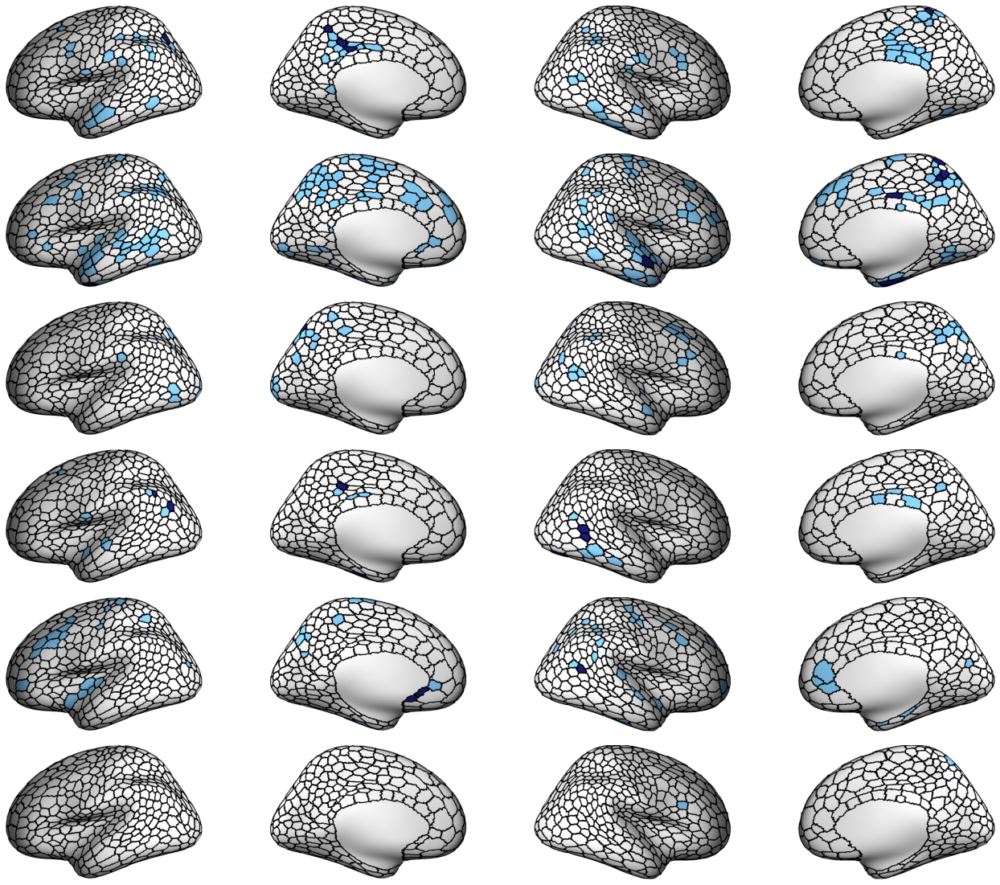

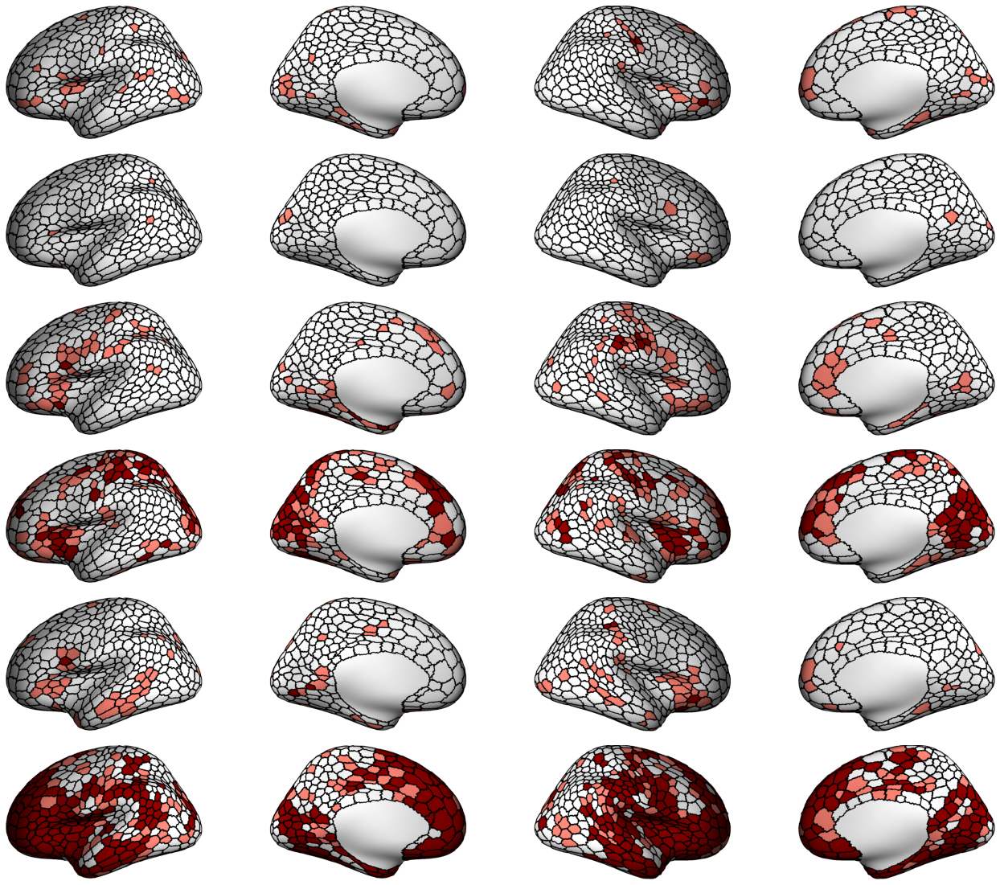

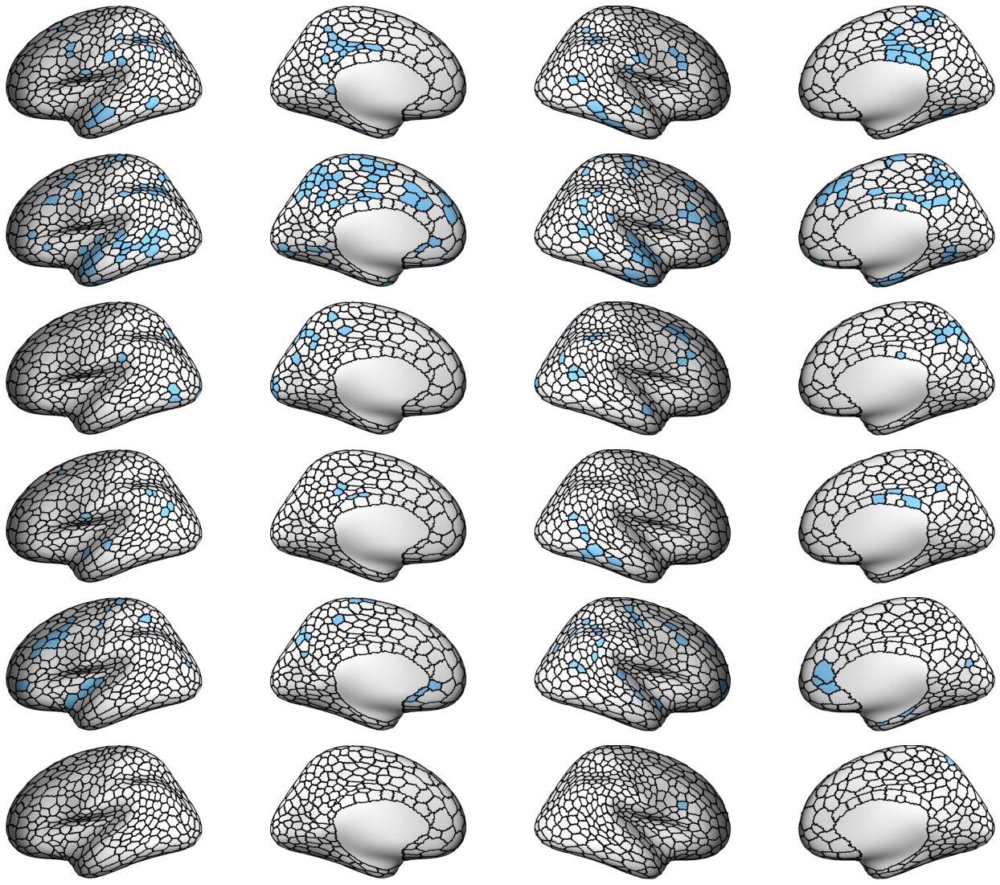

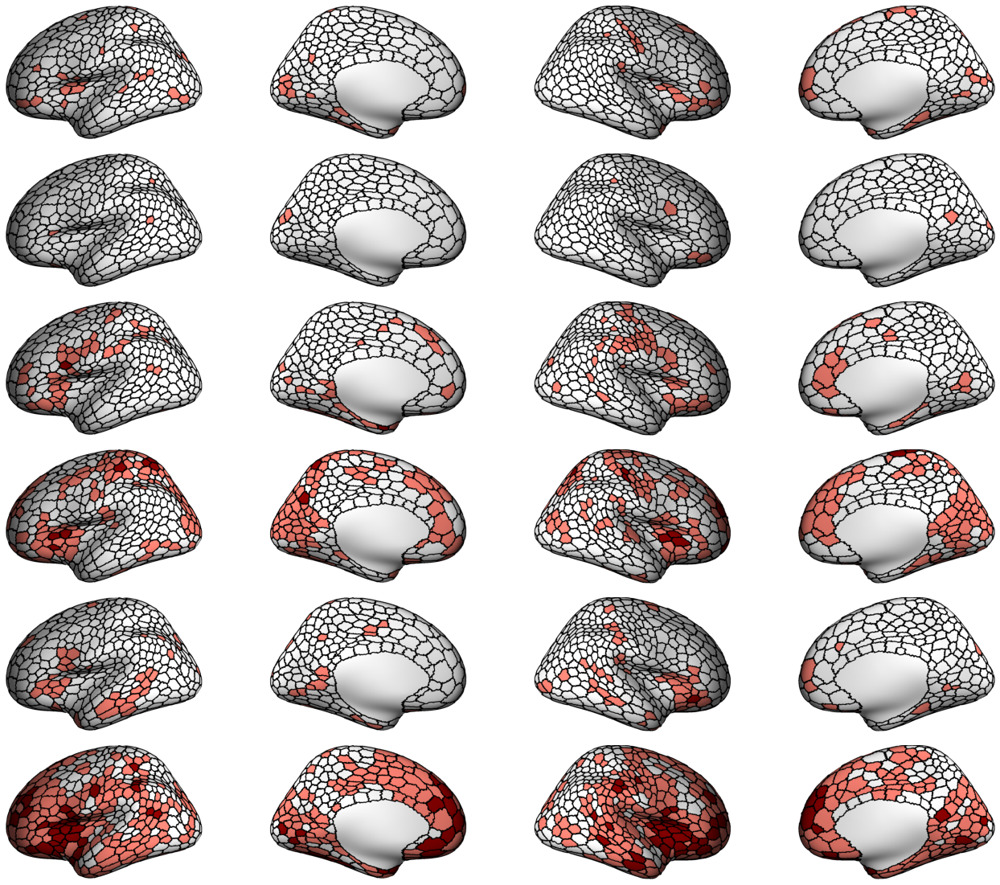

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os.path

#Adjustable things
directions = ['c1','c2']
correction_methods = ['cfdr','cfwe'];
patientGroups = ['ADHD','ASD','BIPOL','MDD','OCD','SCZ']

# Cortical
for correction_method in correction_methods:

    for direction in directions:        
            fig,ax = plt.subplots(len(patientGroups),1,figsize=(50,20))
            for i,group in enumerate(patientGroups): 

                main_dir = '/scratch/kg98/Ashlea/parcellation_v2/models/bc_transform/ids/case_control/';

                indir = main_dir +group+'/';

                #instring = 'pvals_bin_ordn_tstat_c1_mean_Nshuf10000'
                #instring = 'pvals_bin_tfce_tstat_cfwep_c1_thr_parc75_bin_TRANSPOSE_union_Nshuf10000';
                instring = 'palm_dat_tstat_'+correction_method+'p_'+direction+'_pthr5'
                #img = cv2.imread(outdir+outstring+".png")
                img = plt.imread(indir+instring+".png")

                ax[i].imshow(img)
                ax[i].axis('off')
            plt.subplots_adjust(wspace=0, hspace=0.1)
            plt_filename =  main_dir + instring+'_combined.png'
            plt.savefig(plt_filename, bbox_inches='tight')# ,dpi=1000)
            #plt.show()

    #fig = plt.gcf()
    #fig.set_size_inches((8.5, 11), forward=False)
    #fig.savefig(plt_filename, dpi=500)